# LD5 - Effects

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from IPython.display import Audio
import soundfile as sf

from IPython.core.display import HTML
HTML(r"""
<style>
    .jp-MarkdownCell .jp-RenderedHTMLCommon {
        font-family: "Times New Roman", Times, serif;
        font-size: 20px
    }
</style>
""")

# Basic effects

In [2]:
data, fs = sf.read('guitar.wav')
x = data[:,0] # stereo to mono
t = np.linspace(0, len(x)/fs, len(x))
Audio(data = x, rate = fs)

## Flanger

In [67]:
delay = 15 # ms
f_flanger = 1 # Hz
gain = 0.5

num = int(delay * 1e-3 * fs)
delaySig = np.zeros(num)

outputSig = np.zeros(len(x))

for i in range(len(x)):
    d = int(0.5 * num * (1 + np.sin(2 * np.pi * f_flanger * i / fs)))
    if i > d:
        outputSig[i] = x[i] + gain * x[i - d]
    else:
        outputSig[i] = x[i]

sig_flanger = outputSig / np.max(abs(outputSig))


In [6]:
Audio(data = sig_flanger, rate = fs)

## Phaser

In [78]:
lfo = np.sin(2 * np.pi * 0.5 * t)
modulation = 1 + 0.5 * lfo

delay_ms = 4
delay_samples = int(delay_ms * fs / 1000)
delay_buffer = np.zeros(delay_samples)
feedback = 0.5

output_signal = np.zeros_like(x)
for i in range(len(x)):
    delayed_sample = delay_buffer[-1]
    input_with_feedback = x[i] + feedback * delayed_sample
    output_signal[i] = input_with_feedback
    delay_buffer = np.roll(delay_buffer, 1)
    delay_buffer[0] = input_with_feedback * modulation[i]

# Normalize the output
sig_phaser = output_signal / np.max(np.abs(output_signal))


In [27]:
Audio(data = sig_phaser, rate = fs)

## chorus

In [199]:
def chorus(input_signal, freq, dry=0.5, wet=0.5, depth=1.0, delay=25.0, fs=fs):

    mil = float(fs) / 1000
    delay *= mil
    depth *= mil
    modwave = (np.sin(2 * np.pi * freq * t) / 2 + 0.5) * depth + delay

    output_signal = np.zeros(len(input_signal))
    for i in range(len(input_signal)):
        index = int(i - modwave[i])
        if index >= 0 & index < len(input_signal):
            output_signal[i] = input_signal[i] * dry + input_signal[index] * wet

    output_signal = output_signal / np.max(np.absolute(output_signal))
    return  output_signal

In [200]:
sig_chorus = chorus(x, 1)

In [201]:
Audio(data = sig_chorus, rate = fs)

## Delay

In [202]:
def delay(input_signal, delaytime, gain, fs):
    # INPUT:    input_signal
    #           delaytime : delay time in [ms] (>50ms & < 5000ms)
    #           gain : delay gain (number betweeen 0 and 1)
    # OUTPUT:   output_signal
    num = int(delaytime * 1e-3 * fs)
    delaysig = np.roll(input_signal, num)
    delaysig[:num] = 0
    output_signal = input_signal + gain * delaysig
    
    output_signal = output_signal / np.max(np.absolute(output_signal))
    return output_signal

In [203]:
sig_delay = delay(x, 200, 0.5, fs)

In [204]:
Audio(data = sig_delay * 0.5, rate = fs)

## overdrive

In [213]:
def overdrive(input_signal, th):
    # INPUT:    input_signal       
    #           th : overdrive signal threshold (<0.5)
    # OUTPUT:   output_signal

    output_signal = np.zeros(len(input_signal))
    for n in range(len(input_signal)):
        if np.absolute(input_signal[n]) < th:
            output_signal[n] = 2 * input_signal[n]
        if np.absolute(input_signal[n]) >= th:
            if input_signal[n] > 0:
                output_signal[n] = (3 - (2 - 3 * input_signal[n])**2) / 3
            if input_signal[n] < 0:
                output_signal[n] = -(3 - (2 - 3 * np.absolute(input_signal[n]))**2) / 3
        if np.absolute(input_signal[n]) > 2 * th:
            if input_signal[n] > 0:
                output_signal[n] = 1
            if input_signal[n] < 0:
                output_signal[n] = -1

    output_signal = output_signal / np.max(np.absolute(output_signal))

    return output_signal

In [214]:
sig_overdrive = overdrive(x, 0.2)

In [215]:
Audio(data = sig_overdrive * 0.1, rate = fs) #!!!!! LOUD !!!!!

# wah-wah

In [216]:
def wahwah(input_signal, damp, minf, maxf, wahf, fs):
    # INPUT:    wahwah : damping factor (< 0.5)
    #           minf : minimum center cutoff frequency (~ 500Hz)
    #           maxf : maximum center cutoff frequency (~ 5000Hz)
    #           wahf : "wah" frequency (~ 2000Hz)
    # OUTPUT:   output_signal
    
    output_signal = np.zeros(len(input_signal))
    outh = np.zeros(len(input_signal))
    outl = np.zeros(len(input_signal))
    delta = wahf / fs
    centerf = np.concatenate((np.arange(minf, maxf, delta), np.arange(maxf, minf, -delta)))
    
    while len(centerf) < len(input_signal):
        centerf = np.concatenate((centerf, centerf))
    
    centerf = centerf[:len(input_signal)]
    f1 = 2 * np.sin(np.pi * centerf[0] / fs)
    outh[0] = input_signal[0]
    output_signal[0] = f1 * outh[0]
    outl[0] = f1 * output_signal[0]

    for n in range(1, len(input_signal)):
        outh[n] = input_signal[n] - outl[n-1] -  2 * damp * output_signal[n-1]
        output_signal[n] = f1 * outh[n] + output_signal[n-1]
        outl[n] = f1 * output_signal[n] + outl[n-1]
        f1 = 2 * np.sin(np.pi * centerf[n] / fs)
    
    output_signal = output_signal / np.max(np.absolute(output_signal))
    return output_signal

In [217]:
sig_wah = wahwah(x, 0.1, 500, 5000, 2000, fs)

In [218]:
Audio(data = sig_wah, rate = fs)

# Delay line 

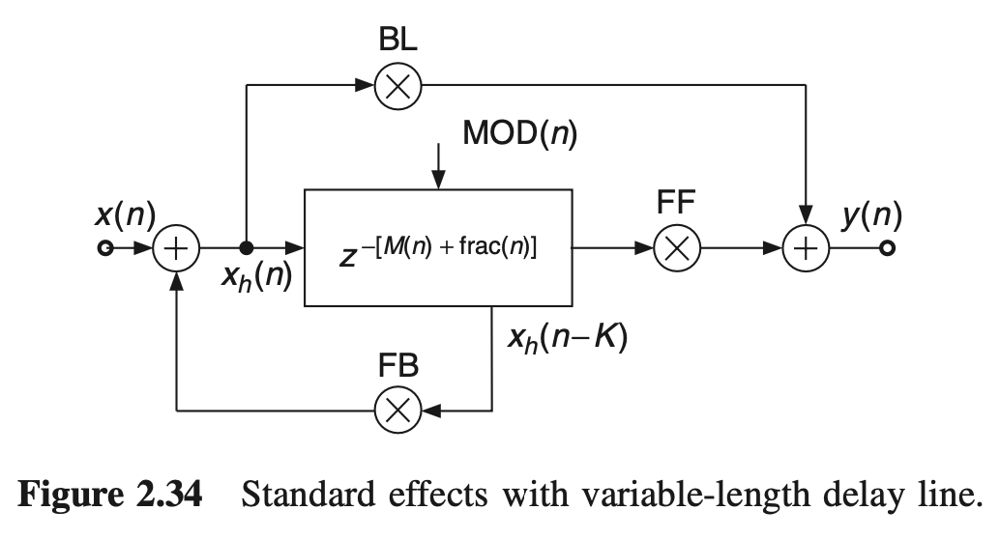
[DAFX p78]

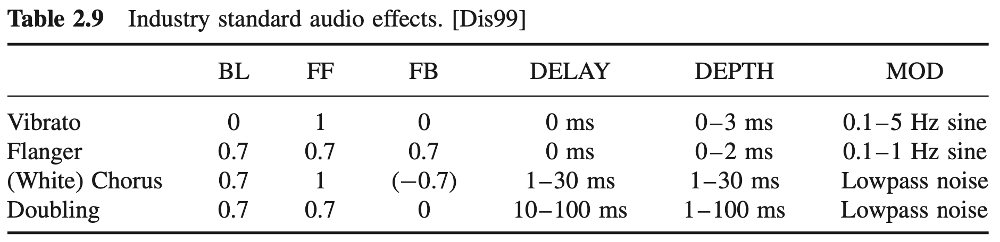

In [219]:
def effects(input_signal, delay, width, ModFreq, gain_FB, gain_BL, gain_FF, fs):
    output_signal = np.zeros(len(input_signal))
    delay = np.round(delay * 1e-3 * fs)  # delay in samples
    width = np.round(width * 1e-3 * fs)  # modulation width in samples
    modFreq = ModFreq / fs  # modulation frequency in samples
    L = int(2 + delay + width * 2)
    DelayLine = np.zeros(L)

    for n in range(len(input_signal)):
        M = modFreq
        MOD = np.sin(M * 2 * np.pi * n)
        TAP = 1 + delay + width * MOD
        i = int(np.floor(TAP))
        frac = TAP - i

        xh_n = input_signal[n] + gain_FB * DelayLine[L-1]
        output_signal[n] = gain_BL * xh_n + gain_FF * DelayLine[L-1]

        DelayLine = np.concatenate(([xh_n], DelayLine[:-1]))  # Shift and add the new sample

        DelayLine[i] = DelayLine[i] * (1 - frac) + DelayLine[i+1] * frac  # Interpolation

    output_signal = output_signal / np.max(np.absolute(output_signal))  # Normalize output

    return output_signal

In [220]:
sig_DL_echo = effects(x, 100, 10, 0, 0.7, 0.7, 0, fs)

In [221]:
Audio(data = sig_DL_echo*0.5, rate = fs)

In [222]:
sig_DL_flanger = effects(x, 10, 2, 0, 0.7, 0.7, 0.7, fs)

In [223]:
Audio(data = sig_DL_flanger*0.5, rate = fs)

# References

- https://github.com/gened1080/guitar-effects/tree/master
- https://github.com/wybiral/python-musical/tree/master
- DAFX (2.6 Delay-based audio effects)

during this course, 



# Dynamic range compressor (TODO)
Implement a basic dynamic range compressor, which needs both a level detector and the gain computer, and test what it does to some test signals


# Antiquing (TODO)
Try to make a music files sound “old” by filtering and distortion.